# Mouse snRNA Annotation
## Hippocampus

In [4]:
library(Matrix)
suppressPackageStartupMessages(library(Seurat))
suppressPackageStartupMessages(library(tidyverse))
suppressPackageStartupMessages(library(viridis))
library(RColorBrewer)
library(data.table)
options(future.globals.maxSize = 10000 * 1024^2)
future.seed=TRUE
source("plotting_functions.R")

In [5]:
system("mkdir ../../plots/")
system("mkdir ../../plots/qc")
system("mkdir ../../plots/clustering")
system("mkdir ../../plots/annotation")

In [6]:
tissue = "hippocampus"
abrv = "HC"
synapse_id = "EAID_000086"
enc_abrv= "CNS"
markers_tissue = "Cortex/Hippocampus"

# Read in data

In [7]:
obj = readRDS(paste0("../../seurat/",tissue,"_Parse_10x_integrated.rds"))
obj$sample = factor(obj$sample, 
                    levels = paste0(abrv,"_",rep(c("10","14","25","36","2m","18m"),each=4),rep(c("_M","_F"),each=2),c("_1","_2")))
Idents(obj) = obj$seurat_clusters

In [8]:
sample_cols = spectral_cols(obj@meta.data,"sample")
cluster_cols = set1_cols(obj@meta.data,"seurat_clusters")
depth2_cols = c("#01a0de","#d885ce","#7f1c72")
tech_cols = c("#01a0de","#7f1c72")
sex_cols = c("#f8b4c5","#2900ff")
annot_cols = read.csv("../../../../figures/data/enc4_mouse_snrna_celltypes.csv")
annot_cols = annot_cols[annot_cols$tissue == str_to_title(tissue),]

# QC plots

### Knee plot

In [9]:
tenx_only = subset(obj,subset=technology == "10x")

parse_only = subset(obj,subset=technology == "Parse")
parse_shallow = subset(parse_only,subset=depth1 == "shallow")
parse_deep = subset(parse_only,subset=depth1 == "deep")


In [10]:
parse_deep_knee_plot = knee_df(parse_deep@assays$RNA@counts, "Parse long-read match")
parse_standard_knee_plot = knee_df(parse_shallow@assays$RNA@counts, "Parse standard")
tenx_knee_plot = knee_df(tenx_only@assays$RNA@counts, "10x")

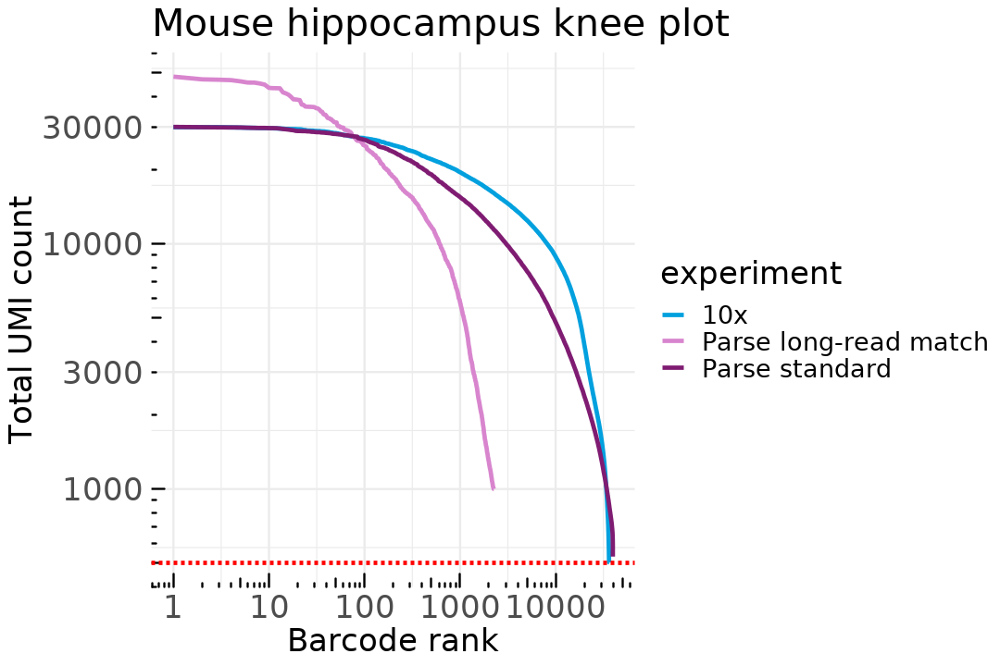

In [11]:
options(repr.plot.width = 9, repr.plot.height = 6)

p = ggplot(rbind(parse_deep_knee_plot,parse_standard_knee_plot,tenx_knee_plot), 
       aes(rank, total, group = experiment, color = experiment))  +
geom_path(size=1) + theme_minimal() + theme(text = element_text(size = 20))  + 
    theme(axis.text.x = element_text(size = 20),
        axis.text.y = element_text(size = 20)) +
scale_y_log10() + scale_x_log10() + annotation_logticks() +
labs(y = "Total UMI count", x = "Barcode rank", title = paste0("Mouse ", tissue ," knee plot"))  + 
geom_hline(yintercept=500, linetype="dashed", color = "red", size=1) +
scale_color_manual(values = depth2_cols)
p


In [12]:
pdf(file="../../plots/qc/experiment_kneeplots.pdf", width = 9, height = 6)
p
dev.off()

png 
  2

### Violin plot of QC metrics split by single cell platform

The default behaviour of split.by has changed.
Separate violin plots are now plotted side-by-side.
To restore the old behaviour of a single split violin,
set split.plot = TRUE.
      
This message will be shown once per session.

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.

Warning message:
"`fun.y` is deprecated. Use `fun` instead."
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.

Warning message:
"`fun.y` is deprecated. Use `fun` instead."
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.



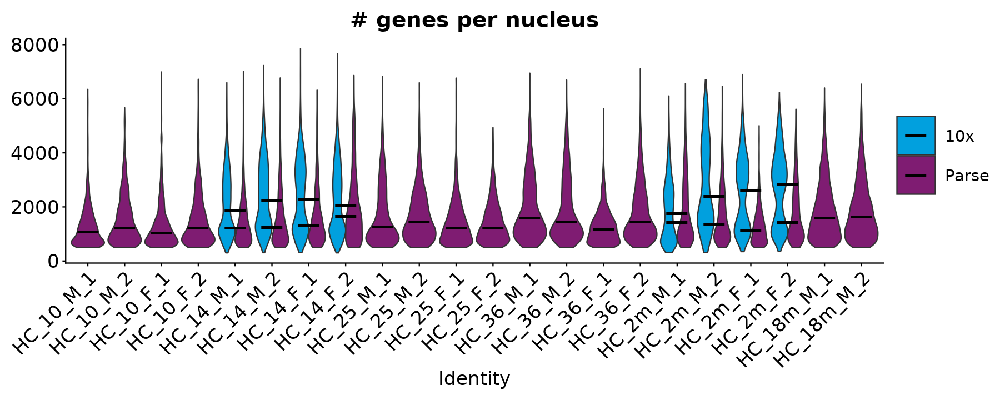

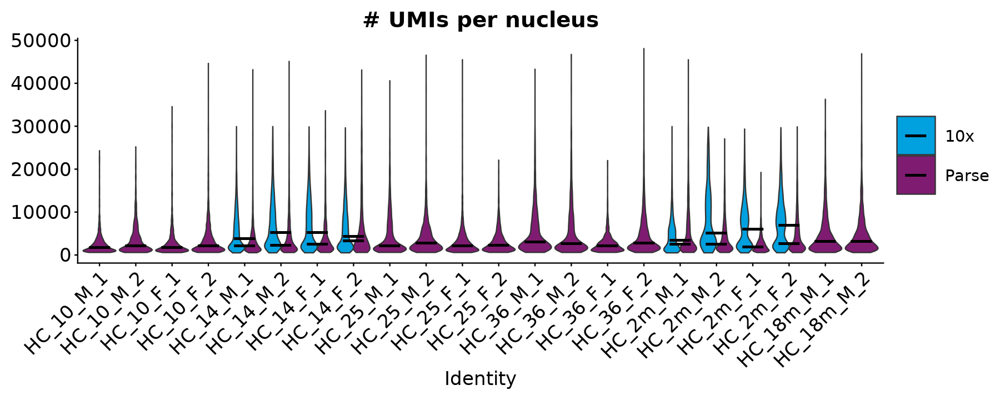

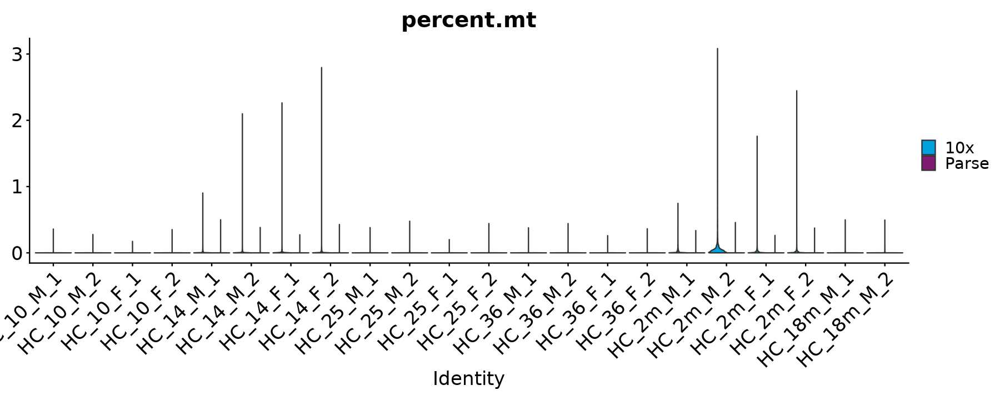

In [5]:
options(repr.plot.width = 15, repr.plot.height = 6)
p = VlnPlot(obj, features = c("nFeature_RNA"), ncol = 1, split.by = "technology",
        pt.size = 0, group.by = "sample")+ ggtitle("# genes per nucleus") +
        scale_fill_manual(values = tech_cols) +
        stat_summary(fun.y = median, geom='point', size = 15, colour = "black", shape = 95) + 
        theme(text = element_text(size = 20),
              axis.text.x = element_text(size = 20),
              axis.text.y = element_text(size = 20))

p1 = VlnPlot(obj, features = c("nCount_RNA"), ncol = 1, split.by = "technology",
        pt.size = 0, group.by = "sample") + ggtitle("# UMIs per nucleus") +
        scale_fill_manual(values = tech_cols) +
        stat_summary(fun.y = median, geom='point', size = 15, colour = "black", shape = 95) + 
        theme(text = element_text(size = 20), 
              axis.text.x = element_text(size = 20), 
              axis.text.y = element_text(size = 20))

p2 = VlnPlot(obj, features = c("percent.mt"), ncol = 1, split.by = "technology",
        pt.size = 0, group.by = "sample") + 
        scale_fill_manual(values = tech_cols) +
        theme(text = element_text(size = 20),
                axis.text.x = element_text(size = 20),
                axis.text.y = element_text(size = 20))
p
p1
p2

In [6]:
pdf(file="../../plots/qc/experiment_violinplots.pdf", width = 15, height = 6)
p
p1
p2
dev.off()

png 
  2

## UMAP "Feature Plots" of QC metadata

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



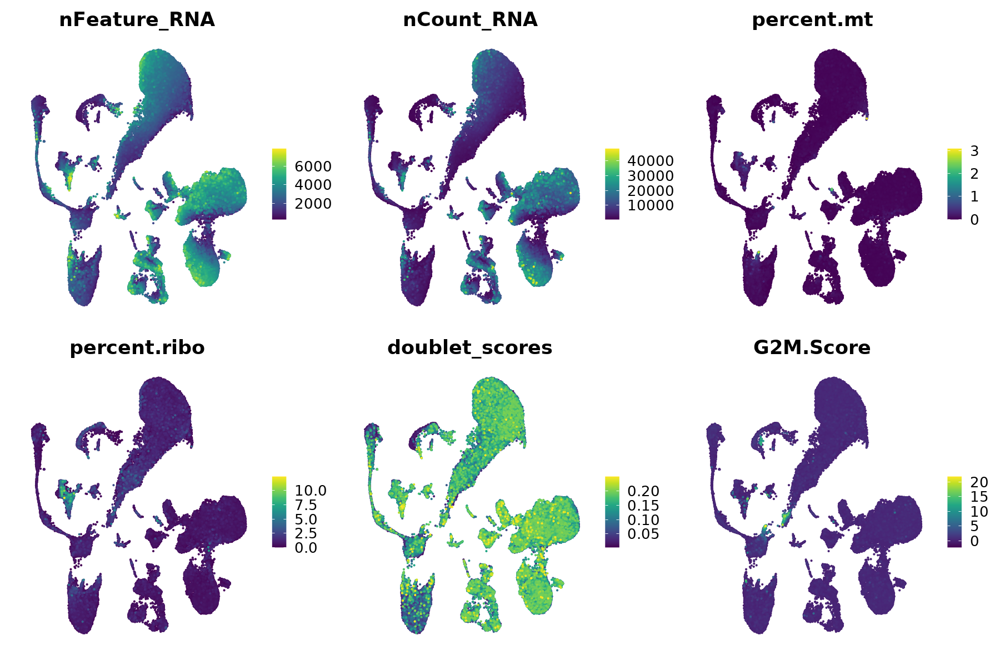

In [7]:
options(repr.plot.width = 15, repr.plot.height = 10)

featureplot(obj,c("nFeature_RNA",
                        "nCount_RNA",
                        "percent.mt",
                        "percent.ribo",
                        "doublet_scores",
                        "G2M.Score"))


In [8]:
pdf(file="../../plots/qc/qc_featureplot.png", width = 15, height = 10)
featureplot(obj,c("nFeature_RNA",
                        "nCount_RNA",
                        "percent.mt",
                        "percent.ribo",
                        "doublet_scores",
                        "G2M.Score"))
dev.off()

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



png 
  2

# Check integration and clustering

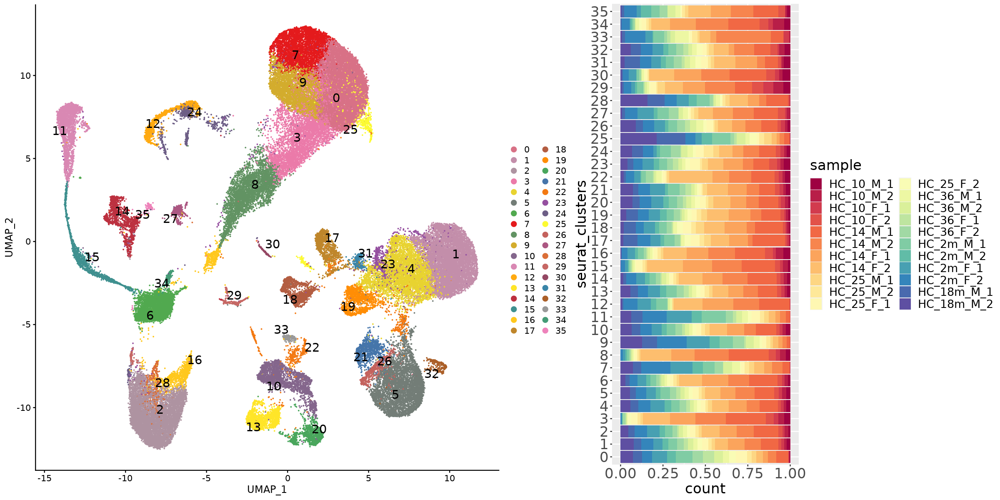

In [9]:
options(repr.plot.width = 20, repr.plot.height = 10)

p1=DimPlot(obj, reduction = "umap", label = TRUE, label.size=6,repel = TRUE, cols = cluster_cols)

p2=ggplot(obj@meta.data, aes(x=seurat_clusters, fill=sample)) + geom_bar(position = "fill") +
theme(text = element_text(size = 20), axis.text.x = element_text(size = 20), 
      axis.text.y = element_text(size = 20)) + scale_fill_manual(values = sample_cols) & coord_flip()
gridExtra::grid.arrange(
  p1, p2,
  widths = c(2,1.5),
  layout_matrix = rbind(c(1, 2)))


In [10]:
pdf(file="../../plots/clustering/UMAP_cluster_sample_barplot.pdf",
    width = 20, height = 10)

gridExtra::grid.arrange(
  p1, p2,
  widths = c(2,1.5),
  layout_matrix = rbind(c(1, 2)))


dev.off()

png 
  2

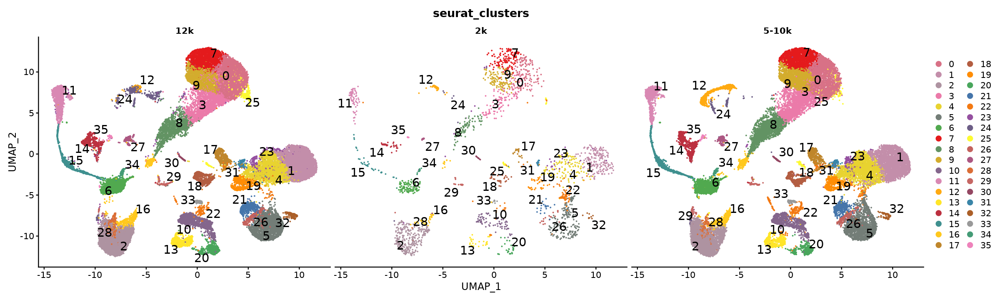

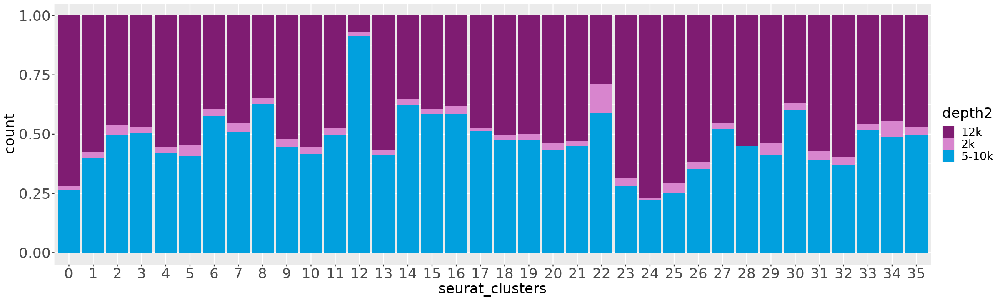

In [11]:
options(repr.plot.width = 20, repr.plot.height = 6)

p = DimPlot(obj, reduction = "umap", group.by = "seurat_clusters",
            split.by = "depth2", label = TRUE, 
            label.size = 6, repel = TRUE, cols = cluster_cols)
p1 = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=depth2)) + geom_bar(position = "fill") + 
    scale_fill_manual(values = rev(depth2_cols)) +
    theme(text = element_text(size = 20), 
          axis.text.x = element_text(size = 20), 
          axis.text.y = element_text(size = 20))

p
p1

In [12]:
pdf(file="../../plots/clustering/Parse_10x_experiment_distribution.pdf",
    width = 20, height = 6)
p
p1
dev.off()

png 
  2

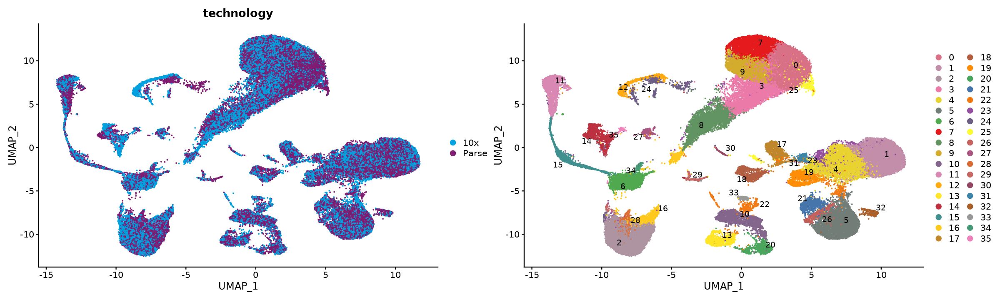

In [13]:
p1 = DimPlot(obj, reduction = "umap", group.by = "technology", shuffle = T) + scale_color_manual(values = tech_cols)
p2 = DimPlot(obj, reduction = "umap", label = TRUE, repel = TRUE, cols = cluster_cols)
p1 + p2

In [14]:
pdf(file="../../plots/clustering/UMAP_Parse_10x.pdf",
    width = 20, height = 8)
p1 + p2
dev.off()

png 
  2

Warning message:
"ggrepel: 3 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


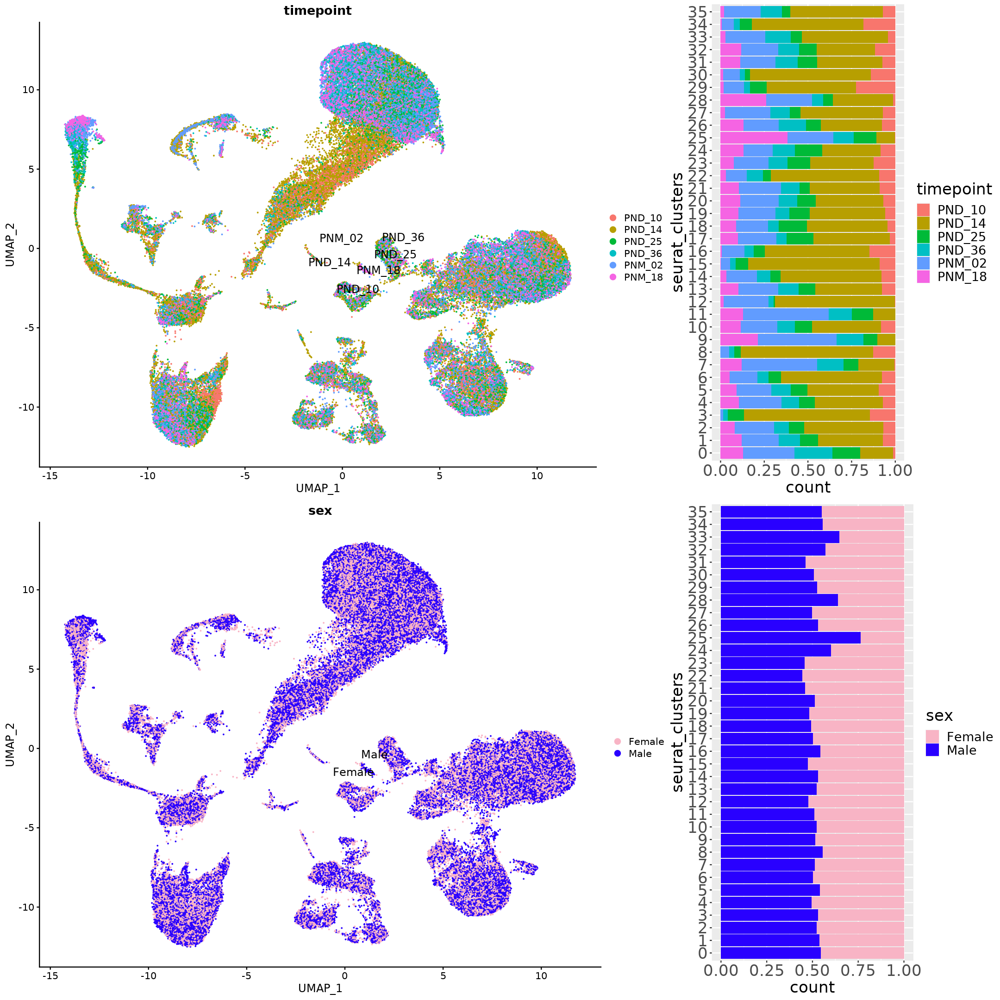

In [15]:
options(repr.plot.width = 18, repr.plot.height = 18)

p1 = DimPlot(obj, reduction = "umap", group.by = "timepoint", label = TRUE, label.size = 5, repel = TRUE)
p2 = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=timepoint)) + geom_bar(position = "fill") + 
theme(text = element_text(size = 20), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20)) & coord_flip()

p3 = DimPlot(obj, reduction = "umap", group.by = "sex", label = TRUE, label.size = 5, repel = TRUE, shuffle = T) + scale_color_manual(values = sex_cols)
p4 = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=sex)) + geom_bar(position = "fill") + scale_fill_manual(values = sex_cols) +
theme(text = element_text(size = 20), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20)) & coord_flip()
gridExtra::grid.arrange(
  p1, p2, p3, p4,
  widths = c(2,1),
  layout_matrix = rbind(c(1, 2),
                        c(3, 4)))



In [16]:
pdf(file="../../plots/clustering/UMAP_age_sex_barplot.pdf",
    width = 18, height = 18)
gridExtra::grid.arrange(
  p1, p2, p3, p4,
  widths = c(2,1),
  layout_matrix = rbind(c(1, 2),
                        c(3, 4)))

dev.off()

png 
  2

# Celltype annotation

### Check predictions

Warning message:
"ggrepel: 12 unlabeled data points (too many overlaps). Consider increasing max.overlaps"
Warning message:
"ggrepel: 68 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


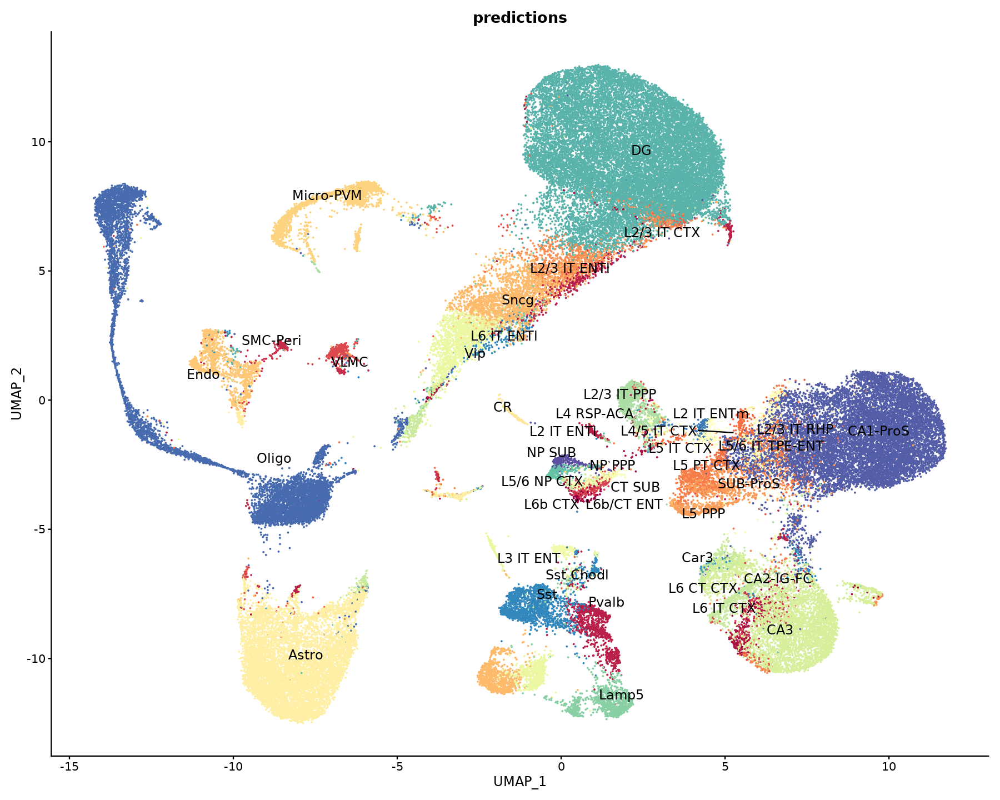

Warning message:
"ggrepel: 7 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


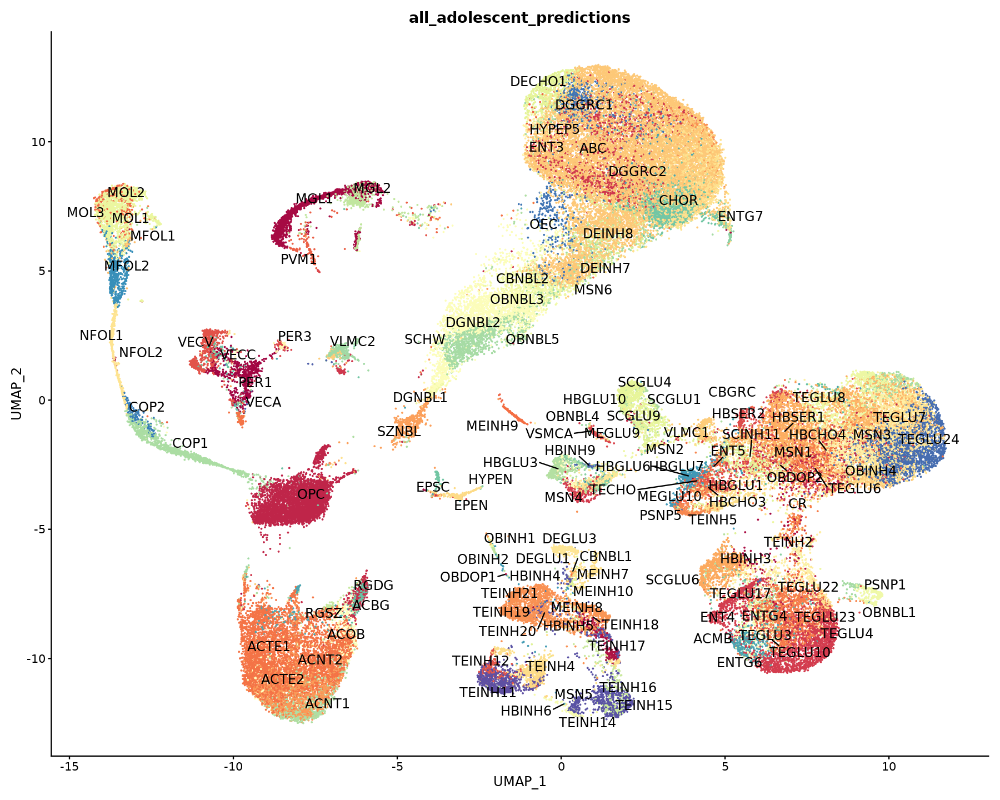

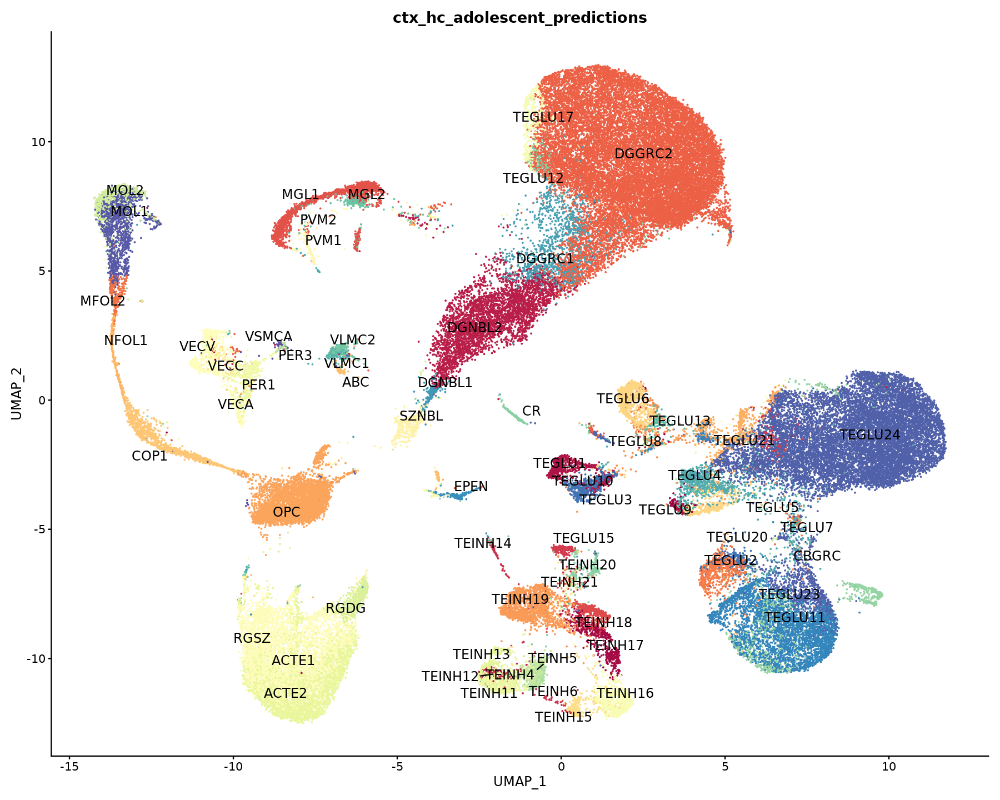

In [17]:
options(repr.plot.width = 15, repr.plot.height = 12)

cols = sample(spectral_cols(obj@meta.data,"predictions"))
umap1 = DimPlot(obj, reduction = "umap", group.by = "predictions", label = TRUE, 
                        label.size = 5, repel = TRUE) + 
    scale_color_manual(values = cols)

cols = sample(spectral_cols(obj@meta.data,"all_adolescent_predictions"))
umap2 = DimPlot(obj, reduction = "umap", group.by = "all_adolescent_predictions", label = TRUE, 
                        label.size = 5, repel = TRUE)+ 
    scale_color_manual(values = cols)

cols = sample(spectral_cols(obj@meta.data,"ctx_hc_adolescent_predictions"))
umap3 = DimPlot(obj, reduction = "umap", group.by = "ctx_hc_adolescent_predictions", label = TRUE, 
                        label.size = 5, repel = TRUE) +
    scale_color_manual(values = cols)

umap1 & NoLegend()
umap2 & NoLegend()
umap3 & NoLegend()



In [18]:
pdf(file="../../plots/annotation/UMAPs_predictions.pdf",
    width = 15, height = 12)
umap1 & NoLegend()
umap2 & NoLegend()
umap3 & NoLegend()
dev.off()


Warning message:
"ggrepel: 7 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


png 
  2

### Check marker gene expression

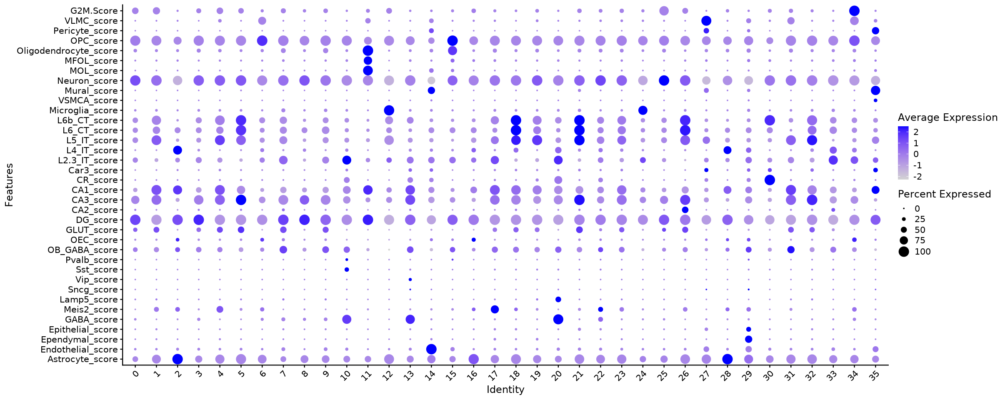

In [19]:
DefaultAssay(obj) = "SCT"
markers = read.csv("../../../ref/IGVF_curated_markers.csv")
markers = markers[markers$Tissue == markers_tissue,]
markers = markers[markers$Gene %in% rownames(obj),]

for (celltype in unique(markers$Subtype)){
    label = paste0(celltype,"_score")
    genes = unique(markers$Gene[markers$Subtype == celltype])
    obj[[label]] = PercentageFeatureSet(obj,features = genes)
    
}
options(repr.plot.width = 20, repr.plot.height= 8)
Idents(obj) = obj$seurat_clusters
p = DotPlot(obj, features =  c(paste0(unique(markers$Subtype),"_score"),"G2M.Score"))+ 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) & coord_flip() 
p

In [20]:
pdf(file="../../plots/annotation/cluster_marker_dotplot.pdf",width = 24, height = 5)
p
dev.off()

png 
  2

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will rep

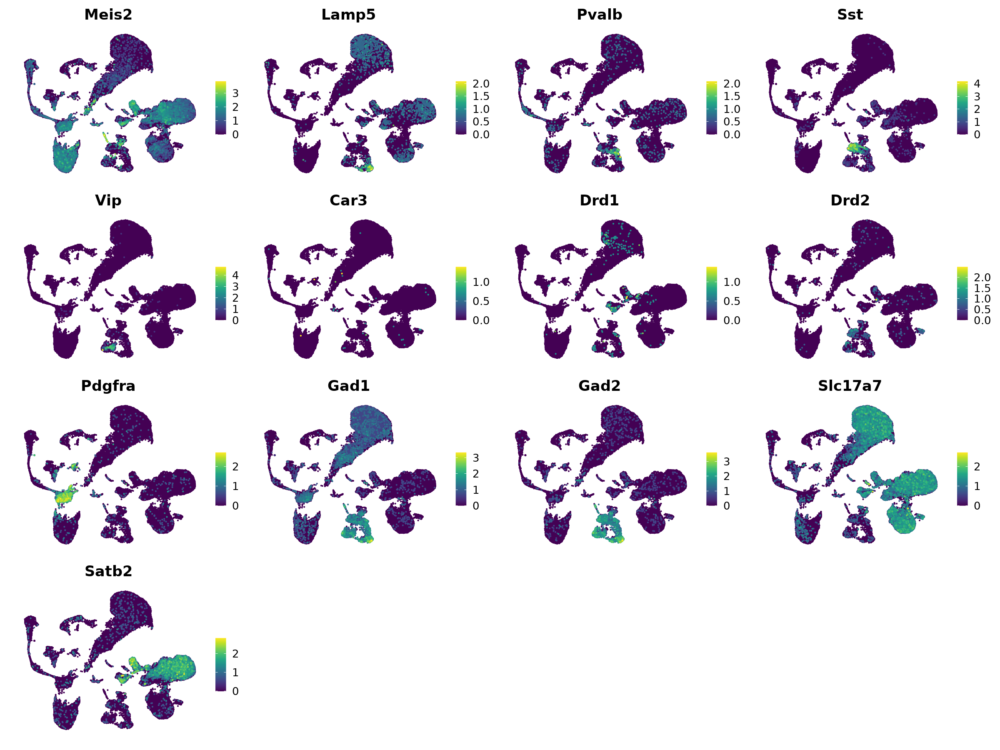

In [21]:
options(repr.plot.width = 20, repr.plot.height= 15)

featureplot(obj, c("Meis2",
                        "Lamp5",
                        "Pvalb",
                        "Sst",
                        "Vip",
                        "Car3",
                        "Drd1",
                        "Drd2",
                        "Pdgfra",
                         "Gad1","Gad2",
                        "Slc17a7","Satb2"))

In [22]:
pdf(file="../../plots/annotation/celltype_featureplot.pdf",width = 20, height = 15)
featureplot(obj, c("Meis2",
                        "Lamp5",
                        "Pvalb",
                        "Sst",
                        "Vip",
                        "Car3",
                        "Drd1",
                        "Drd2",
                        "Pdgfra",
                         "Gad1","Gad2",
                        "Slc17a7","Satb2"))
dev.off()

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will rep

png 
  2

## Sub-cluster

In [ ]:
DefaultAssay(obj) = "integrated"
Idents(obj) = obj$seurat_clusters
obj = FindSubCluster(obj,
                     cluster = 10,
                     resolution = 0.05,
                     graph.name = "integrated_snn",
                     subcluster.name = "sub.cluster")

Idents(obj) = obj$sub.cluster
obj = FindSubCluster(obj,
                     cluster = 16,
                     resolution = 0.05,
                     graph.name = "integrated_snn",
                     subcluster.name = "sub.cluster2")

Idents(obj) = obj$sub.cluster2
obj = FindSubCluster(obj,
                     cluster = 22,
                     resolution = 0.02,
                     graph.name = "integrated_snn",
                     subcluster.name = "sub.cluster3")

obj$sub.cluster = obj$sub.cluster3
obj$sub.cluster3 = NULL
obj$sub.cluster2 = NULL



In [23]:
subcluster_cols = set1_cols(obj@meta.data,"sub.cluster")


In [24]:
options(repr.plot.width = 20, repr.plot.height = 10)

Idents(obj) = obj$sub.cluster
p1=DimPlot(obj, reduction = "umap", label = TRUE, label.size=6,repel = TRUE, cols = subcluster_cols)

p2=ggplot(obj@meta.data, aes(x=sub.cluster, fill=sample)) + geom_bar(position = "fill") +
theme(text = element_text(size = 20), axis.text.x = element_text(size = 20), 
      axis.text.y = element_text(size = 20)) + scale_fill_manual(values = sample_cols) & coord_flip()
pdf(file="../../plots/clustering/UMAP_subcluster_sample_barplot.pdf",
    width = 20, height = 10)

gridExtra::grid.arrange(
  p1, p2,
  widths = c(2,1.5),
  layout_matrix = rbind(c(1, 2)))


dev.off()

options(repr.plot.width = 20, repr.plot.height = 6)

p = DimPlot(obj, reduction = "umap", group.by = "sub.cluster",
            split.by = "depth2", label = TRUE, 
            label.size = 6, repel = TRUE, cols = subcluster_cols)
p1 = ggplot(obj@meta.data, aes(x=sub.cluster, fill=depth2)) + geom_bar(position = "fill") + 
    scale_fill_manual(values = depth2_cols) +
    theme(text = element_text(size = 20), 
          axis.text.x = element_text(size = 20), 
          axis.text.y = element_text(size = 20))+ 
    theme(axis.text.x = element_text(angle = 45, hjust = 1))

pdf(file="../../plots/clustering/Parse_10x_experiment_distribution_subclusters.pdf",
    width = 20, height = 6)
p
p1
dev.off()

p1 = DimPlot(obj, reduction = "umap", group.by = "technology", shuffle = T) + scale_color_manual(values = tech_cols)
p2 = DimPlot(obj, reduction = "umap", label = TRUE, repel = TRUE, cols = subcluster_cols)

pdf(file="../../plots/clustering/UMAP_Parse_10x_subclusters.pdf",
    width = 20, height = 8)
p1 + p2
dev.off()

options(repr.plot.width = 18, repr.plot.height = 20)

p1 = DimPlot(obj, reduction = "umap", group.by = "timepoint", label = TRUE, label.size = 5, repel = TRUE)
p2 = ggplot(obj@meta.data, aes(x=sub.cluster, fill=timepoint)) + geom_bar(position = "fill") + 
theme(text = element_text(size = 20), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20)) & coord_flip()

p3 = DimPlot(obj, reduction = "umap", group.by = "sex", label = TRUE, label.size = 5, repel = TRUE, shuffle = T) + scale_color_manual(values = sex_cols)
p4 = ggplot(obj@meta.data, aes(x=sub.cluster, fill=sex)) + geom_bar(position = "fill") + scale_fill_manual(values = sex_cols) +
theme(text = element_text(size = 20), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20)) & coord_flip()

pdf(file="../../plots/clustering/UMAP_age_sex_barplot_subclusters.pdf",
    width = 18, height = 18)
gridExtra::grid.arrange(
  p1, p2, p3, p4,
  widths = c(2,1),
  layout_matrix = rbind(c(1, 2),
                        c(3, 4)))

dev.off()





png 
  2

png 
  2

png 
  2

png 
  2

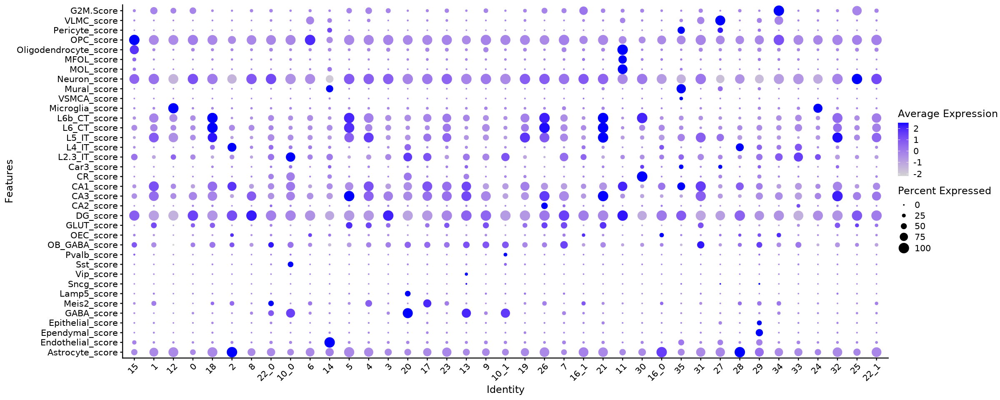

In [25]:
DefaultAssay(obj) = "SCT"
for (celltype in unique(markers$Subtype)){
    label = paste0(celltype,"_score")
    genes = unique(markers$Gene[markers$Subtype == celltype])
    obj[[label]] = PercentageFeatureSet(obj,features = genes)
    
}
options(repr.plot.width = 20, repr.plot.height= 8)
Idents(obj) = obj$sub.cluster
p = DotPlot(obj, features =  c(paste0(unique(markers$Subtype),"_score"),"G2M.Score"))+ 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) & coord_flip() 
p

In [26]:
pdf(file="../../plots/annotation/subcluster_marker_dotplot.pdf",width = 24, height = 5)
p
dev.off()

png 
  2

## Order clusters

In [27]:
Idents(obj) = obj$sub.cluster
order = c(2,28,"16_0", # astrocyte
          14, # endothelial
          29, # ependymal
          "22_0", # Meis2_GABA
          20, # lamp5_GABA
          13, # Vip_GABA
          "10_0", # Sst_GABA
          "10_1", # Pvalb_GABA
          7,9,0,25, # DG
          3,8,"16_1",
          32,5,26,21,"22_1", # CA3
          1,4,23,31,# CA1
          30, # CR
          19,  # SUB_ProS
          18, # L6
          17, # l2/3
          33, # thamalic
          12,24, # microglia
          11, # mol
          15, # mfol
          6,34, # opc
          35, # pericyte
          27 # vlmc          
         )

Idents(obj) = factor(Idents(obj), levels = order)


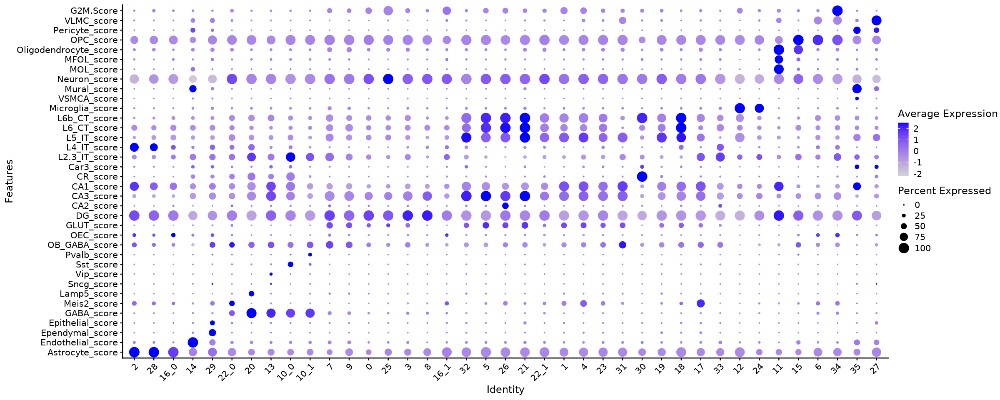

In [28]:
options(repr.plot.width = 20, repr.plot.height= 8)
p = DotPlot(obj, features =  c(paste0(unique(markers$Subtype),"_score"),"G2M.Score"))+ 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) & coord_flip() 
p

In [29]:
pdf(file="../../plots/annotation/subcluster_marker_dotplot_sorted.pdf",width = 24, height = 5)
p
dev.off()

png 
  2

## Name clusters

In [30]:
subtypes = c(rep("Astrocyte",3),# 2,28,16_0,
              "Endothelial",# 14
              "Ependymal", #29
              "Meis2", #22
              "Lamp5", #20
              "Vip", # 13
              "Sst", # 10_0
              "Pvalb", # 10_1
              rep("DG",4), #7,9,0,25,3,8,
              rep("DG_early",3), #6,34,16_1
              rep("CA3",5), #32,5,26,21,22_1,
              rep("CA1",4), #1,4,23,31,
              "CR", # 30
              "SUB_ProS",# 19
              "L5/6", # 18
              "L2/3", # 17
              "Glut_other", # 33
              rep("Microglia",2), #12,24,
              "MOL", # 11
              "MFOL", # 15
              rep("OPC",2), #6,34,
              "Pericyte", # 35
              "VLMC" # 27
             )

names(subtypes) = levels(Idents(obj))
obj = RenameIdents(obj, subtypes)

order = c("Astrocyte","Endothelial","Ependymal",
          "Meis2","Lamp5","Vip","Sst","Pvalb",
          "DG_early","DG","CA3","CA1","CR","Glut_other","L2/3","L5/6","SUB_ProS",
          "Microglia",
          "MOL","MFOL","OPC",
          "Pericyte","VLMC") 
Idents(obj) = factor(Idents(obj), levels = order)
obj$subtypes = Idents(obj)
table(obj$subtypes)

obj$celltypes = obj$subtypes
obj$celltypes = gsub("MOL","Oligodendrocyte",obj$celltypes)
obj$celltypes = gsub("MFOL","Oligodendrocyte",obj$celltypes)
obj$celltypes = gsub("CA1","Glutamatergic",obj$celltypes)
obj$celltypes = gsub("CA3","Glutamatergic",obj$celltypes)
obj$celltypes = gsub("DG_early","Glutamatergic",obj$celltypes)
obj$celltypes = gsub("DG","Glutamatergic",obj$celltypes)
obj$celltypes = gsub("L2/3","Glutamatergic",obj$celltypes)
obj$celltypes = gsub("L5/6","Glutamatergic",obj$celltypes)
obj$celltypes = gsub("SUB_ProS","Glutamatergic",obj$celltypes)
obj$celltypes = gsub("Glut_other","Glutamatergic",obj$celltypes)
obj$celltypes = gsub("CR","Glutamatergic",obj$celltypes)
obj$celltypes = gsub("Meis2","GABAergic",obj$celltypes)
obj$celltypes = gsub("Lamp5","GABAergic",obj$celltypes)
obj$celltypes = gsub("Vip","GABAergic",obj$celltypes)
obj$celltypes = gsub("Sst","GABAergic",obj$celltypes)
obj$celltypes = gsub("Pvalb","GABAergic",obj$celltypes)

order = c("Astrocyte","Endothelial","Ependymal",
          "GABAergic",
          "Glutamatergic",
          "Microglia",
          "Oligodendrocyte","OPC",
          "Pericyte","VLMC")
obj$celltypes = factor(obj$celltypes, levels = order)
table(obj$celltypes)

obj$gen_celltype = obj$celltypes
obj$gen_celltype = gsub("GABAergic","Neuron",obj$gen_celltype)
obj$gen_celltype = gsub("Glutamatergic","Neuron",obj$gen_celltype)
obj$gen_celltype = gsub("Ependymal","Stromal",obj$gen_celltype)
obj$gen_celltype = gsub("Microglia","Immune",obj$gen_celltype)
obj$gen_celltype = gsub("Oligodendrocyte","Glial",obj$gen_celltype)
obj$gen_celltype = gsub("OPC","Glial",obj$gen_celltype)
obj$gen_celltype = gsub("Astrocyte","Glial",obj$gen_celltype)

order = c("Endothelial","Stromal",
          "Neuron",
          "Immune",
          "Glial",
          "Pericyte","VLMC")
obj$gen_celltype = factor(obj$gen_celltype, levels = order)
table(obj$gen_celltype)


  Astrocyte Endothelial   Ependymal       Meis2       Lamp5         Vip 
       8474        1504         428         614        1060        1512 
        Sst       Pvalb    DG_early          DG         CA3         CA1 
       1407        1128        9287       16255        6635       13519 
         CR  Glut_other        L2/3        L5/6    SUB_ProS   Microglia 
        387         235        1353        1337        1298        2848 
        MOL        MFOL         OPC    Pericyte        VLMC 
       2443        1480        4208         211         544 


      Astrocyte     Endothelial       Ependymal       GABAergic   Glutamatergic 
           8474            1504             428            5721           50306 
      Microglia Oligodendrocyte             OPC        Pericyte            VLMC 
           2848            3923            4208             211             544 


Endothelial     Stromal      Neuron      Immune       Glial    Pericyte 
       1504         428       56027        2848       16605         211 
       VLMC 
        544 

## Update metadata for integration with other ENCODE data
submission_celltype, cell_type_mnemonic, CL_ID_annotation

In [31]:
obj$submission_celltype  = obj$celltypes
obj$submission_celltype = gsub("Astrocyte","astrocyte",obj$submission_celltype)
obj$submission_celltype = gsub("Ependymal","ependymal cell",obj$submission_celltype)
obj$submission_celltype = gsub("Endothelial","endothelial cell",obj$submission_celltype)
obj$submission_celltype = gsub("GABAergic","inhibitory neuron",obj$submission_celltype)
obj$submission_celltype = gsub("Glutamatergic","excitatory neuron",obj$submission_celltype)
obj$submission_celltype = gsub("Microglia","microglial cell",obj$submission_celltype)
obj$submission_celltype = gsub("Oligodendrocyte","oligodendrocyte",obj$submission_celltype)
obj$submission_celltype = gsub("OPC","oligodendrocyte precursor cell",obj$submission_celltype)
obj$submission_celltype = gsub("Pericyte","pericyte",obj$submission_celltype)
obj$submission_celltype = gsub("VLMC","vascular leptomeningeal cell",obj$submission_celltype)

table(obj$submission_celltype)

obj$cell_type_mnemonic  = obj$submission_celltype
obj$cell_type_mnemonic = gsub("astrocyte","ASTR",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<ependymal cell\\>","EPND_CNS",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<endothelial cell\\>","ENDO_CNS",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<inhibitory neuron\\>","NEU_INHB",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<excitatory neuron\\>","NEU_EXCT_CNS",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<microglial cell\\>","MGLIA_CNS",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<oligodendrocyte precursor cell\\>","OLIGDP_CNS",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<oligodendrocyte\\>","OLIGD_CNS",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<pericyte\\>","PERI_CNS",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<vascular leptomeningeal cell\\>","VLMC_CNS",obj$cell_type_mnemonic)

table(obj$cell_type_mnemonic)

obj$CL_ID_annotation  = obj$cell_type_mnemonic
obj$CL_ID_annotation = gsub("ASTR","CL:0000127",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("ENDO_CNS","CL:0000115",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("EPND_CNS","CL:0000065",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("NEU_INHB","CL:0011005",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("NEU_EXCT_CNS","CL:0000679",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("MGLIA_CNS","CL:0000129",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("\\<OLIGD_CNS\\>","CL:0000128",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("\\<OLIGDP_CNS\\>","CL:0002453",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("PERI_CNS","CL:0000669",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("VLMC_CNS","CL:4023051",obj$CL_ID_annotation)
table(obj$CL_ID_annotation)

obj$synapse = synapse_id
obj$tissue_mnemonic = enc_abrv



                     astrocyte               endothelial cell 
                          8474                           1504 
                ependymal cell              excitatory neuron 
                           428                          50306 
             inhibitory neuron                microglial cell 
                          5721                           2848 
               oligodendrocyte oligodendrocyte precursor cell 
                          3923                           4208 
                      pericyte   vascular leptomeningeal cell 
                           211                            544 


        ASTR     ENDO_CNS     EPND_CNS    MGLIA_CNS NEU_EXCT_CNS     NEU_INHB 
        8474         1504          428         2848        50306         5721 
  OLIGDP_CNS    OLIGD_CNS     PERI_CNS     VLMC_CNS 
        4208         3923          211          544 


CL:0000065 CL:0000115 CL:0000127 CL:0000128 CL:0000129 CL:0000669 CL:0000679 
       428       1504       8474       3923       2848        211      50306 
CL:0002453 CL:0011005 CL:4023051 
      4208       5721        544 

# Annotated plots

In [32]:
subtype_cols = annot_cols[match(levels(obj$subtypes),annot_cols$subtypes),"subtype_color"]
celltype_cols = annot_cols[match(levels(obj$celltypes),annot_cols$celltypes),"celltype_color"]
gen_celltype_cols = annot_cols[match(levels(obj$gen_celltype),annot_cols$gen_celltype),"gen_celltype_color"]

Warning message:
"ggrepel: 19 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


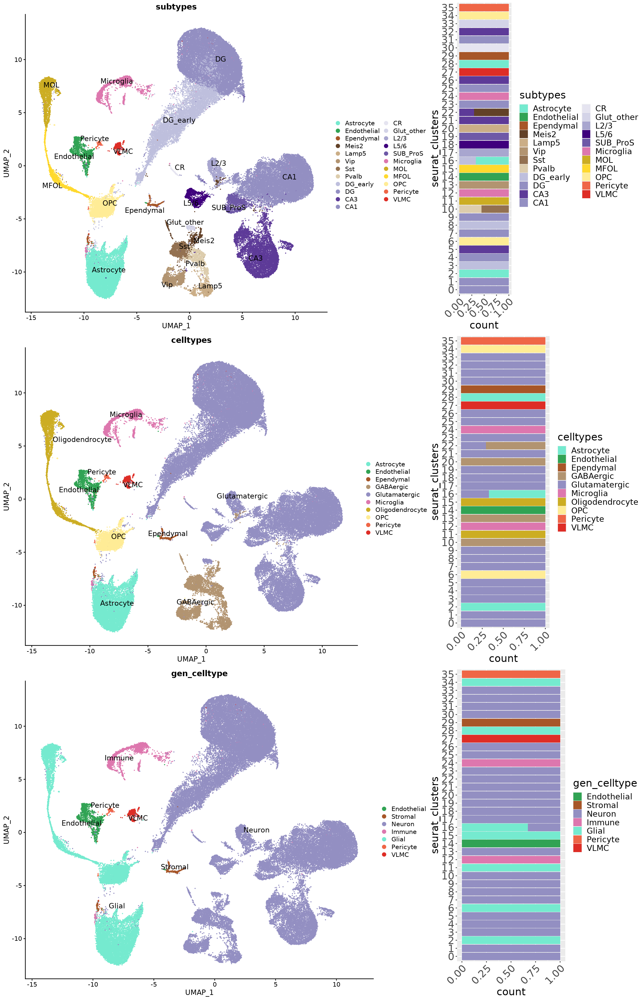

In [33]:
options(repr.plot.width = 18, repr.plot.height = 28)

umap_subtypes = DimPlot(obj, reduction = "umap", group.by = "subtypes", label = TRUE, 
                        label.size = 5, repel = TRUE) + scale_color_manual(values = subtype_cols)
cluster_subtypes = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=subtypes)) + 
    scale_fill_manual(values = subtype_cols) + geom_bar(position = "fill") + 
    theme(text = element_text(size = 20), 
          axis.text.x = element_text(size = 20,angle = 45, hjust = 1), 
          axis.text.y = element_text(size = 20)) & coord_flip()


umap_celltypes = DimPlot(obj, reduction = "umap", group.by = "celltypes", label = TRUE, 
                        label.size = 5, repel = TRUE) + scale_color_manual(values = celltype_cols)
cluster_celltypes = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=celltypes)) + 
    scale_fill_manual(values = celltype_cols) + geom_bar(position = "fill") + 
    theme(text = element_text(size = 20), 
          axis.text.x = element_text(size = 20,angle = 45, hjust = 1), 
          axis.text.y = element_text(size = 20)) & coord_flip()

umap_gen_celltypes = DimPlot(obj, reduction = "umap", group.by = "gen_celltype", label = TRUE, 
                        label.size = 5, repel = TRUE) + scale_color_manual(values = gen_celltype_cols)
cluster_gen_celltypes = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=gen_celltype)) + 
    scale_fill_manual(values = gen_celltype_cols) + geom_bar(position = "fill") + 
    theme(text = element_text(size = 20), 
          axis.text.x = element_text(size = 20,angle = 45, hjust = 1), 
          axis.text.y = element_text(size = 20)) & coord_flip()


gridExtra::grid.arrange(
    umap_subtypes, cluster_subtypes,
    umap_celltypes, cluster_celltypes,
    umap_gen_celltypes, cluster_gen_celltypes,
  widths = c(2,1),
  layout_matrix = rbind(c(1, 2),
                       c(3, 4),
                       c(5, 6)))


In [34]:
pdf(file="../../plots/annotation/UMAPs_barplots.pdf",width = 18,height=28)

gridExtra::grid.arrange(
    umap_subtypes, cluster_subtypes,
    umap_celltypes, cluster_celltypes,
    umap_gen_celltypes, cluster_gen_celltypes,
  widths = c(2,1),
  layout_matrix = rbind(c(1, 2),
                       c(3, 4),
                       c(5, 6)))

dev.off()

png 
  2

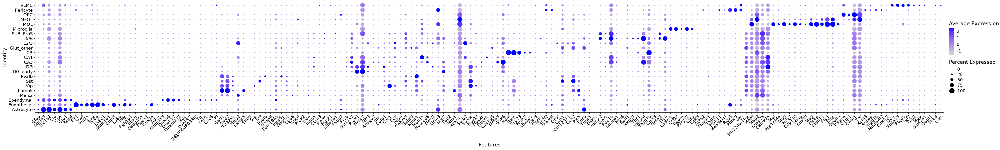

In [35]:
options(repr.plot.width = 40, repr.plot.height = 6)

Idents(obj) = obj$subtypes
p = DotPlot(obj, features =  unique(markers$Gene)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
p


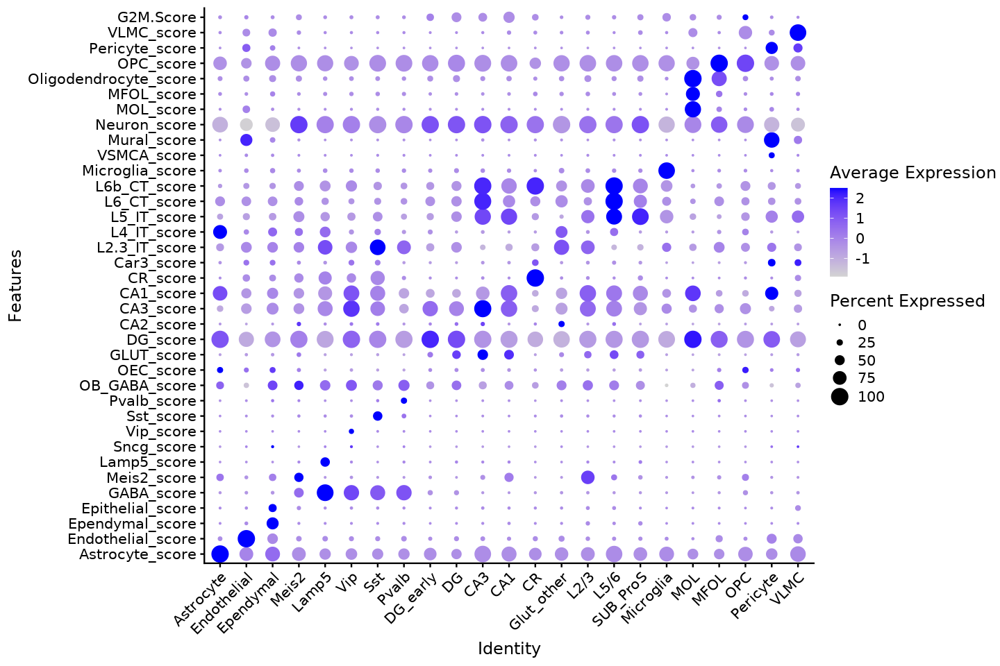

In [36]:
options(repr.plot.width = 12, repr.plot.height = 8)

p1 = DotPlot(obj, features =  c(paste0(unique(markers$Subtype),"_score"),"G2M.Score"))+ 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) & coord_flip() 

p1


In [37]:
pdf(file="../../plots/annotation/subtypes_marker_dotplot.pdf",width = 40, height = 6)
p
dev.off()

png 
  2

In [38]:
pdf(file="../../plots/annotation/subtypes_marker_score_dotplot.pdf",width = 12, height = 8)
p1
dev.off()

png 
  2

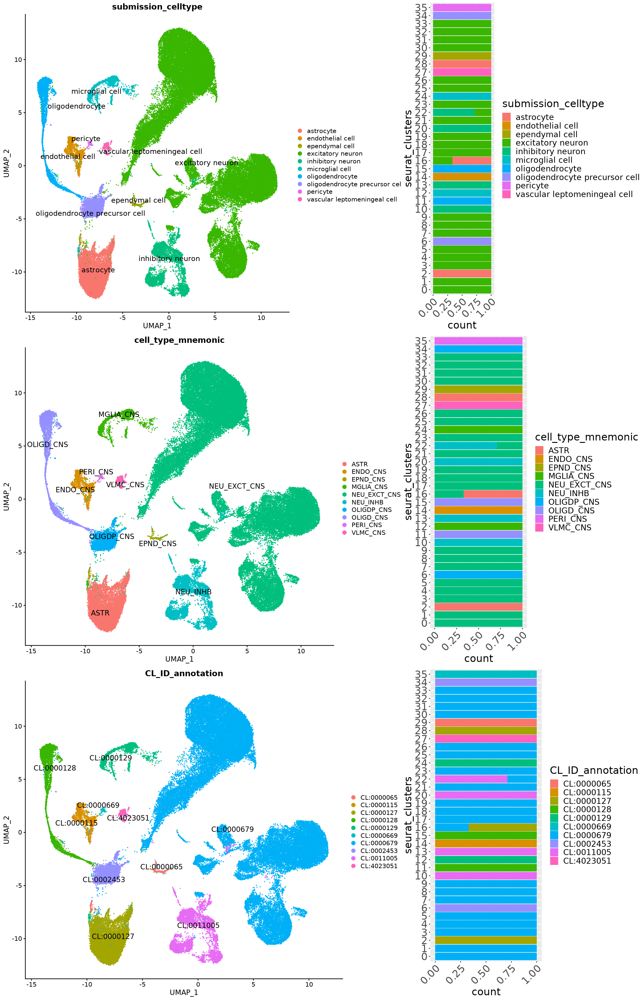

In [39]:
options(repr.plot.width = 18, repr.plot.height = 28)

umap1 = DimPlot(obj, reduction = "umap", group.by = "submission_celltype", label = TRUE, 
                        label.size = 5, repel = TRUE) #& NoLegend()
cluster1 = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=submission_celltype)) + geom_bar(position = "fill") + 
    theme(text = element_text(size = 20), 
          axis.text.x = element_text(size = 20,angle = 45, hjust = 1), 
          axis.text.y = element_text(size = 20)) & coord_flip()#& NoLegend()


umap2 = DimPlot(obj, reduction = "umap", group.by = "cell_type_mnemonic", label = TRUE, 
                        label.size = 5, repel = TRUE)
cluster2 = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=cell_type_mnemonic)) + geom_bar(position = "fill") + 
    theme(text = element_text(size = 20), 
          axis.text.x = element_text(size = 20,angle = 45, hjust = 1), 
          axis.text.y = element_text(size = 20)) & coord_flip()

umap3 = DimPlot(obj, reduction = "umap", group.by = "CL_ID_annotation", label = TRUE, 
                        label.size = 5, repel = TRUE)
cluster3 = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=CL_ID_annotation)) + geom_bar(position = "fill") + 
    theme(text = element_text(size = 20), 
          axis.text.x = element_text(size = 20,angle = 45, hjust = 1), 
          axis.text.y = element_text(size = 20)) & coord_flip()


gridExtra::grid.arrange(
    umap1, cluster1,
    umap2, cluster2,
    umap3, cluster3,
  widths = c(2,1.2),
  layout_matrix = rbind(c(1, 2),
                       c(3, 4),
                       c(5, 6)))


In [40]:
pdf(file="../../plots/annotation/UMAPs_barplots_submissions.pdf",
    width = 15, height = 10)
gridExtra::grid.arrange(
    umap1, cluster1,
    umap2, cluster2,
    umap3, cluster3,
  widths = c(2,1),
  layout_matrix = rbind(c(1, 2),
                       c(3, 4),
                       c(5, 6)))
dev.off()


png 
  2

## Get ENC dataset (experiment_accession) from enc4_mouse_metadata_fixed.csv

In [41]:
expt_acc = read.csv("../../../ref/enc4_mouse_metadata_fixed.csv")
expt_acc = expt_acc[,c("sublibrary_sample","experiment_accession")]

In [42]:
seurat_metadata = obj@meta.data
seurat_metadata$experiment_accession = NULL

In [43]:
seurat_metadata = left_join(seurat_metadata,expt_acc,by="sublibrary_sample")

In [44]:
obj$rna_experiment_accession = seurat_metadata$experiment_accession

In [45]:
table(obj$rna_experiment_accession)


ENCSR075HVN ENCSR079CKL ENCSR079GGS ENCSR127LUZ ENCSR203XJO ENCSR257VQO 
        910         307        2441         111        3176         124 
ENCSR329JYG ENCSR399EUZ ENCSR435CMT ENCSR483SSM ENCSR499ZYZ ENCSR539XHZ 
        132        3076        2960        2963         192        7612 
ENCSR545URU ENCSR569LJC ENCSR613VKV ENCSR642QUS ENCSR736JKX ENCSR742NWO 
       6719        4006         205        4188         213        2738 
ENCSR767FKE ENCSR824CFI ENCSR835JFN ENCSR846QIZ ENCSR859XOI ENCSR888TQC 
        185         139        3430        2382         142         102 
ENCSR940VCU ENCSR944XPC ENCSR967YET ENCSR968RPR ENCSR973WCI ENCSR979MRY 
       3713        6026        4070        3977         132         116 
ENCSR983TAK ENCSR987SOK ENCSR995ZKH 
        151        5348        6181 

# Save

In [56]:
saveRDS(obj,file=paste0("../../seurat/",tissue,"_Parse_10x_integrated.rds"))


In [49]:
write.csv(obj@meta.data,file=paste0("../../seurat/",str_to_lower(tissue),"_Parse_10x_integrated_metadata.csv"))



In [46]:
obj_parse = subset(obj, subset = technology == "Parse")
saveRDS(obj_parse, file = paste0("../../seurat/",tissue,"_Parse.rds"))

obj_10x = subset(obj, subset = technology == "10x")
saveRDS(obj_10x, file = paste0("../../seurat/",tissue,"_10x.rds"))


In [47]:
write.csv(obj_parse@meta.data, file=paste0("../../seurat/",tissue,"_Parse_metadata.csv"))

write.csv(obj_10x@meta.data, file=paste0("../../seurat/",tissue,"_10x_metadata.csv"))



# Subset for regulatory genes & save matrices for input into Topyfic

In [50]:
reg_genes = read.csv("../../../ref/gene_display_table_expressed_7categories.csv")

In [51]:
table(reg_genes$gene_name %in% rownames(obj@assays$RNA@counts))


TRUE 
2701 

In [52]:
mtx_parse = obj_parse@assays$RNA@counts
mtx_parse = mtx_parse[rownames(mtx_parse) %in% reg_genes$gene_name, ]
mtx_parse = mtx_parse[match(reg_genes$gene_name, rownames(mtx_parse)), ]

mtx_10x = obj_10x@assays$RNA@counts
mtx_10x = mtx_10x[rownames(mtx_10x) %in% reg_genes$gene_name, ]
mtx_10x = mtx_10x[match(reg_genes$gene_name, rownames(mtx_10x)), ]

In [53]:
table(rownames(mtx_parse) == reg_genes$gene_name)
table(rownames(mtx_10x) == reg_genes$gene_name)


TRUE 
2701 


TRUE 
2701 

In [54]:
writeMM(mtx_parse, file=paste0("../../seurat/",tissue,"_Parse.mtx"))

writeMM(mtx_10x, file=paste0("../../seurat/",tissue,"_10x.mtx"))



NULL

NULL